In [88]:
%pylab inline

import astropy.io.fits as pyfits
from configparser import ConfigParser

from ddmap import halosim
from ddmap.pixel3D import cartesianGrid3D
from ddmap import halolet
from ddmap.halolet import massmap_ks2D

Populating the interactive namespace from numpy and matplotlib


In [97]:
# configuration
configName  =   '../../tests/config_halolet.ini' 
parser      =   ConfigParser()
parser.read(configName)

# Reconstruction Init
parser.set('lens','resolve_lim','0.01') #pix
parser.set('lens','rs_base','0.5955')    #Mpc/h
parser.set('sparse','nframe','1' )

# Pixelation
gridInfo=   cartesianGrid3D(parser)
lensKer1=   gridInfo.lensing_kernel(deltaIn=False)
L       =   gridInfo.nx*gridInfo.scale
modelDict=  halolet.nfwShearlet2D(parser,lensKer1)

xx=np.fft.fftshift(np.fft.fftfreq(gridInfo.nx,1./gridInfo.nx))
yy=np.fft.fftshift(np.fft.fftfreq(gridInfo.ny,1./gridInfo.ny))
XX,YY=np.meshgrid(xx,yy)

In [98]:
z_h     =  0.2425
log_m   =  15.6
M_200   =  10.**(log_m)
conc    =  4.#6.02*(M_200/1.E13)**(-0.12)*(1.47/(1.+z_h))**(0.16)
halo    =  halosim.nfw_lensTJ03(mass=M_200,conc=conc,redshift=z_h,ra=0.,dec=0.)
dr      =  halo.DaLens*gridInfo.scale/180*np.pi

np.testing.assert_almost_equal(modelDict.rs_frame[4],halo.rs_arcsec/gridInfo.scale/3600.,3)

lk      =   halo.lensKernel(gridInfo.zcgrid)
nsamp   =   2000000
ra      =   np.random.rand(nsamp)*L-L/2.
dec     =   np.random.rand(nsamp)*L-L/2.
redshift=   np.ones(nsamp)*0.1
sigma   =   halo.Sigma(ra*3600.,dec*3600.)
data0   =   gridInfo.pixelize_data(ra,dec,redshift,sigma,\
               method='FFT')[0]

dsigma  =   halo.DeltaSigmaComplex(ra*3600.,dec*3600.)
g1Pix   =   gridInfo.pixelize_data(ra,dec,redshift,dsigma.real,\
               method='FFT')[0]
g2Pix   =   gridInfo.pixelize_data(ra,dec,redshift,dsigma.imag,\
               method='FFT')[0]
data1   =   g1Pix+1j*g2Pix

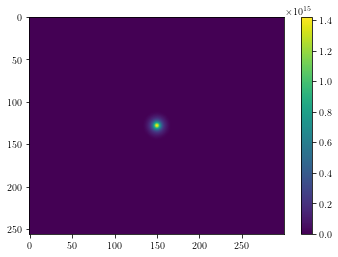

In [99]:
plt.imshow(data0);plt.colorbar()

1.0077977577219153


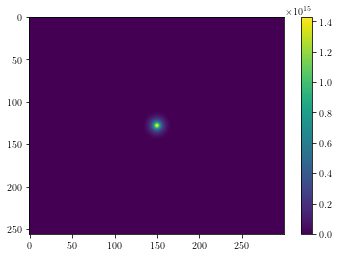

In [100]:
totest0=np.fft.fftshift(np.fft.ifft2(modelDict.fouaframesInter[4,0]).real)*M_200
plt.imshow(totest0);plt.colorbar()
print(np.sum(data0)/np.sum(totest0))

-0.007737423170638513


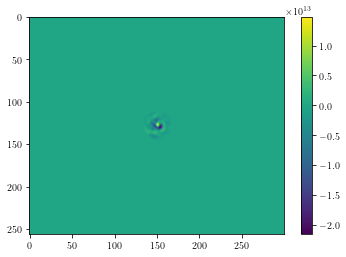

In [101]:
plt.imshow(totest0-data0);plt.colorbar()
print(np.sum(totest0-data0)/np.sum(data0))

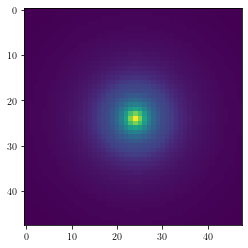

In [28]:
plt.imshow(data1[1])

1.016558718048542
0.0
2.9628000192194797e-15


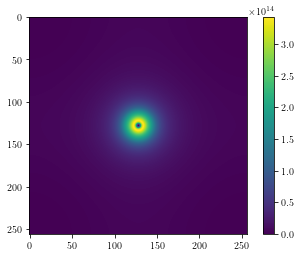

In [95]:
totest1=np.fft.fftshift(np.fft.ifft2(modelDict.fouaframes[4,0]))*M_200
plt.imshow(np.abs(totest1));plt.colorbar()
print(np.sum(np.abs(data1))/np.sum(np.abs(totest1)))
print((np.sum(XX**2.*np.abs(totest1))-np.sum(YY**2.*np.abs(totest1)))/np.sum(np.abs(totest1)))
print((np.sum(2.*XX*YY*np.abs(totest1)))/np.sum(np.abs(totest1)))

0.05529788266584359


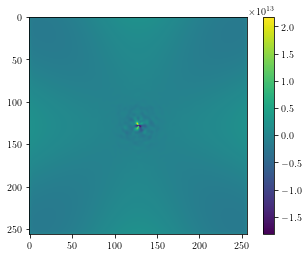

In [96]:
plt.imshow(np.abs(totest1)-np.abs(data1));plt.colorbar()
print(np.sum(np.abs(np.abs(totest1)-np.abs(data1)))/np.sum(np.abs(data1)))